# Machine Problem 1
----
*By:* \
*Gonzales* \
*Gulane* \
*Mingo* \
*Panchacala* 

In [6]:
using Random
using Plots
using LinearAlgebra
using Distributions
using CSV
using DataFrames

### Functions

In [7]:
function perceptron_learning_rule(X, y, epochs=10, learning_rate=0.01)

    n, p = size(X)
    d = Uniform(-1,1)
    weight_vec = rand(d, p+1)               # Initialize the weights using random values
    perceptron_updates = Perceptron[]
    cost = 10000
    push!(perceptron_updates, Perceptron(weight_vec, cost))
    best_model = perceptron_updates[end]
    t = 0

    while cost > 0 && t < epochs

        running_cost = 0

        for i=1:n

            # calculate the predictions using the model parameters
            weight_vec_prev = weight_vec
            y_hat = predict(weight_vec, X[i,:])

            # update the parameters using the data
            weight_vec[1] = weight_vec_prev[1] + learning_rate * (y[i] - y_hat)
            for j = 1:p
                weight_vec[j+1] = weight_vec_prev[j+1] + learning_rate * (y[i] - y_hat) * X[i,j]
            end

            running_cost = running_cost + abs(y[i] - y_hat)
        end

        cost = running_cost
        push!(perceptron_updates, Perceptron(weight_vec, cost))

        if best_model.cost > cost
            best_model = perceptron_updates[end]
        end

        t = t + 1
    end

    return best_model
end

perceptron_learning_rule (generic function with 3 methods)

In [8]:
struct Perceptron
    weights::Vector{Real}
    cost::Real
end

function signum(z)

    if z >= 0
        return 1
    end

    return -1
end

function predict(weights, x)
    return signum(dot(x, weights[2:end]) + weights[1])
end

function predict(predictor::Perceptron, x)
    return signum(dot(x, predictor.weights[2:end]) + predictor.weights[1])
end

function misclassification_rate(y_true, y_pred)
    misclassifications = []
    for i=1:length(y_true)
        if y_true[i] == y_pred[i]
            push!(misclassifications, 0)
        else
            push!(misclassifications, 1)
        end
    end
    return sum(misclassifications)/length(y_true)
end

function dec_boundary(X, y, perceptron)
    w = perceptron.weights
    slope =  -(w[1]/w[3]) / (w[1]/w[2])
    intercept = -w[1]/w[3]

    decision_boundary(x) = (slope * x) + intercept

    y_preds = [predict(perceptron, X[i,:]) for i = 1:size(X)[1]]
    misclassification = misclassification_rate(y, y_preds) * 100

    return decision_boundary, misclassification
end

function sensitivity_analysis(X,y,n=10, epochs=10)
    dec_boundaries = []
    misclassification_rates = []

    for i=1:n
        model = perceptron_learning_rule(X,y, epochs)
        boundary, misclassification_rate = dec_boundary(X, y, model)
        push!(dec_boundaries, boundary)
        push!(misclassification_rates, misclassification_rate)
    end

    return dec_boundaries, mean(misclassification_rates)
end

sensitivity_analysis (generic function with 3 methods)

In [9]:
# helper functions -------------------

function plot_sensitivity_analysis(X, y, dec_boundaries, avg_misclassification; figure_title="")
    scatter(X[:,1], X[:,2], group=y, label="")
    plot!(dec_boundaries[1], label="Average MR: $(avg_misclassification)%", legend=:topright)

    for bound in dec_boundaries[2:end]
        plot!(bound, label="")
    end

    display(plot!(title=figure_title))
end

function plot_decision_boundary(X, y, (dec_boundary, misclassification); figure_title="")
    scatter(X[:,1], X[:,2], group=y, label = "")
    plot!(dec_boundary, label="MR: $(misclassification)%", legend=:topright, title=figure_title)
    display(plot!())
end

plot_decision_boundary (generic function with 1 method)

In [10]:
# set seed
Random.seed!(42)

TaskLocalRNG()

# Instructions

You need to implement two functions:
 - dec_boundary: this function finds the decision boundary of the perceptron based on the weights derived by the model
 - sensitivity_analysis: this function uses the dec_boundary to replicate N trainings. Thus, it shows the AVERAGE MISCLASSIFICATION RATE of all the training replications and the decision boundaries for each training replication. You are left to decide how many replications you are going to perform to determine the model's stability.

## Problem 1

### Importing Dataset

In [11]:
dataset_1 = CSV.read("problem_1.csv", DataFrame)

Row,X1,X2,Class
,Float64,Float64,Float64
1,9.26771,6.09835,-1.0
2,5.02924,7.37299,1.0
3,5.16104,10.6784,1.0
4,4.02353,10.0947,1.0
5,11.1768,3.83397,-1.0
6,9.78434,5.58006,-1.0
7,4.90465,9.3467,1.0
8,8.98247,6.6066,-1.0
9,4.63957,9.89236,1.0


### Model Training

In [12]:
X_1 = dataset_1[:,1:2]
y_1 = dataset_1[:,end]
perceptron_model_1 =  perceptron_learning_rule(X_1, y_1) # 10 epochs, 0.01 lr

Perceptron(Real[0.25869024628521786, -0.6908044183996662, 0.6735971776639484], 0.0)

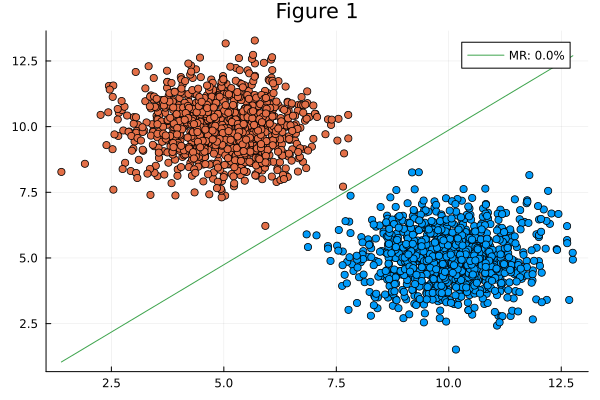

In [13]:
plot_decision_boundary(X_1, y_1, dec_boundary(X_1, y_1, perceptron_model_1); figure_title="Figure 1")

### Sensitivity Analysis

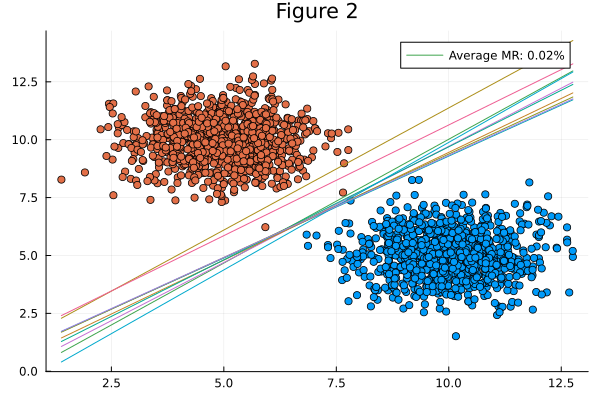

In [14]:
dec_boundaries, avg_misclassification = sensitivity_analysis(X_1,y_1)
plot_sensitivity_analysis(X_1, y_1, dec_boundaries, avg_misclassification; figure_title="Figure 2")

As shown from Figure 1, `perceptron_model_1` (epochs=10, lr=0.01) had a misclassification rate of 0.00%. This means that it was able to perfectly classify all the samples. However, as shown in Figure 2, there were times that when we trained multiple models with epochs=10, and lr=0.01, it would have a misclassification rate that would be greater than 0.00%, meaning that it misclassified some of the samples.

This occurs because of the random weights that are used to initialize each model. There are times that the initial weights are *unlucky* as it would not be able to reach a misclassification rate of 0.00% within the 10 epochs of training.

Additionally, as shown in Figure 2, some of the lines seem to intersect at a specific point, around the area where the orange and blue samples are very close together. This means that the perceptron model is trying very hard to learn how to classify those samples correctly. But the orange and blue samples that are so close together really restrict or bottleneck the model from adjusting more generously. In other words, because the data for each class is a bit more dispersed (especially compared to the other datasets in this exercise), the perceptron has a lesser degree of freedom to adjust.

## Problem 2

### Importing Dataset

In [15]:
dataset_2 = CSV.read("problem_2.csv", DataFrame)

Row,X1,X2,Class
,Float64,Float64,Float64
1,7.99094,13.6628,-1.0
2,14.8708,10.927,1.0
3,9.27359,13.5918,-1.0
4,9.60728,14.4627,-1.0
5,14.704,8.69325,1.0
6,18.8638,10.9705,1.0
7,10.4273,15.3353,-1.0
8,13.1795,13.4864,1.0
9,16.0591,9.03799,1.0


## Model Training

In [16]:
X_2 = dataset_2[:,1:2]
y_2 = dataset_2[:,end]
perceptron_model_2 =  perceptron_learning_rule(X_2, y_2)

Perceptron(Real[-0.1753067413391246, 0.7915693929025721, -0.696719924672314], 0.0)

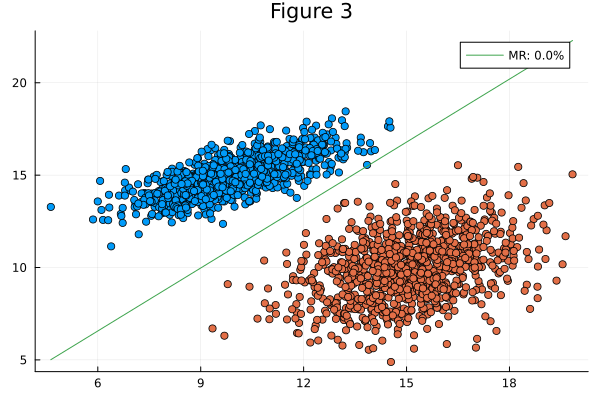

In [18]:
plot_decision_boundary(X_2, y_2, dec_boundary(X_2, y_2, perceptron_model_2), figure_title="Figure 3")

### Sensitivity Analysis

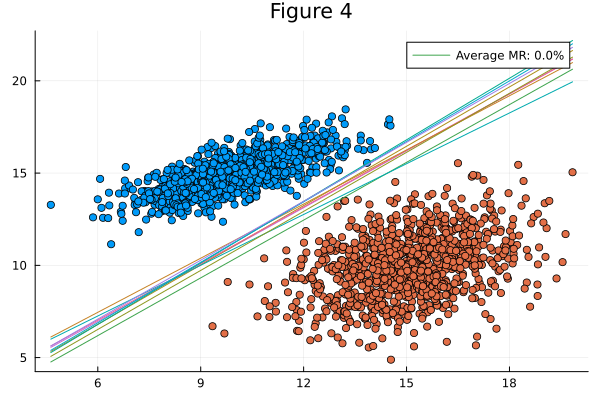

In [22]:
dec_boundaries, avg_misclassification = sensitivity_analysis(X_2,y_2)
plot_sensitivity_analysis(X_2, y_2, dec_boundaries, avg_misclassification, figure_title="Figure 4")

# 20 trainings

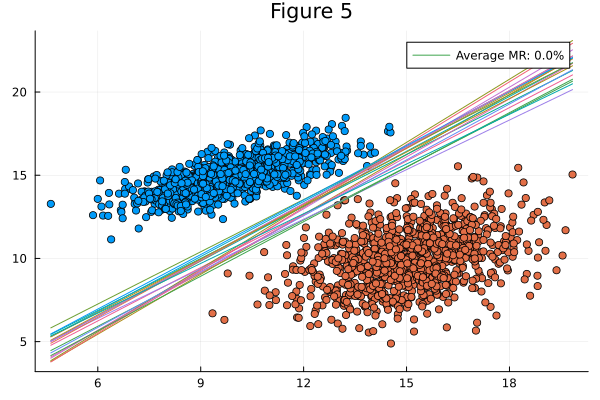

In [26]:
dec_boundaries, avg_misclassification = sensitivity_analysis(X_2,y_2,20)
plot_sensitivity_analysis(X_2, y_2, dec_boundaries, avg_misclassification, figure_title="Figure 5")

# 30 Trainings

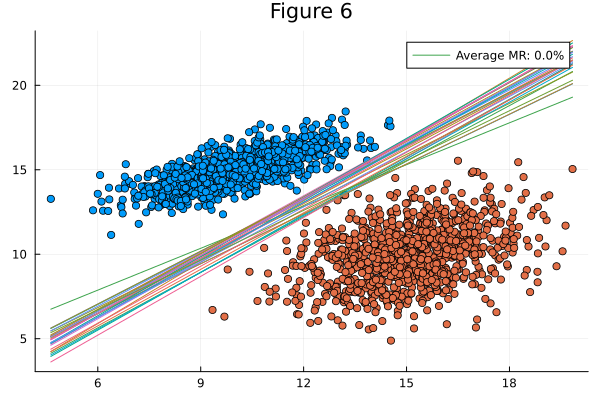

In [25]:
dec_boundaries, avg_misclassification = sensitivity_analysis(X_2,y_2,30)
plot_sensitivity_analysis(X_2, y_2, dec_boundaries, avg_misclassification, figure_title="Figure 6")

In [ ]:
dec_boundaries, avg_misclassification = sensitivity_analysis(X_2,y_2)
plot_sensitivity_analysis(X_2, y_2, dec_boundaries, avg_misclassification, figure_title="Figure 4")

As you can see in figure 3, the perceptron_model_2 has a misclassification rate of 0%. This shows that the model was able to classify the dataset accurately. The perceptron also behaves really well when we run the sensitivity analysis as shown on the figures 4, 5, and 6.

As oppose to problem 1, the perceptron works really well here since the classifications of the dataset has a noticeable or a significant space from each other. As shown in figures 4, 5, and 6 there is a noticeable gap which makes the model less susceptible to misclassifications.


## Problem 3

### Importing Dataset

In [29]:
dataset_3 = CSV.read("problem_3.csv", DataFrame)

Row,X1,X2,Class
,Float64,Float64,Float64
1,2.84882,8.20517,-1.0
2,0.806525,8.34535,-1.0
3,15.7209,4.25458,1.0
4,17.5105,3.7684,1.0
5,14.6863,1.5843,1.0
6,16.3605,2.75231,1.0
7,1.78845,10.6771,-1.0
8,3.85062,10.2262,-1.0
9,2.46848,8.29177,-1.0


### Model Training

In [30]:
X_3 = dataset_3[:,1:2]
y_3 = dataset_3[:,end]
perceptron_model_3 =  perceptron_learning_rule(X_3, y_3)

Perceptron(Real[0.12919631159415204, 0.1338705797937341, -0.23925890211089682], 0.0)

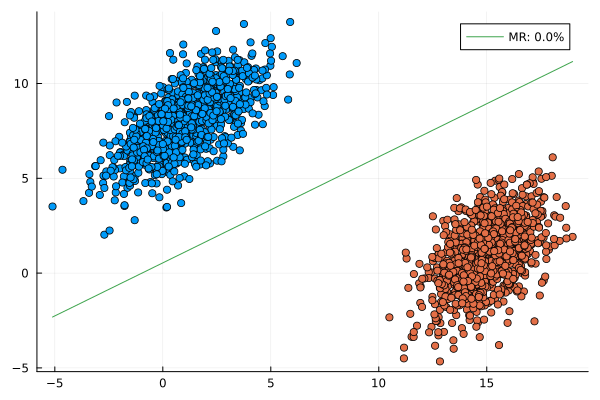

In [31]:
plot_decision_boundary(X_3, y_3, dec_boundary(X_3, y_3, perceptron_model_3), figure_title="Figure 7")

### Sensitivity Analysis

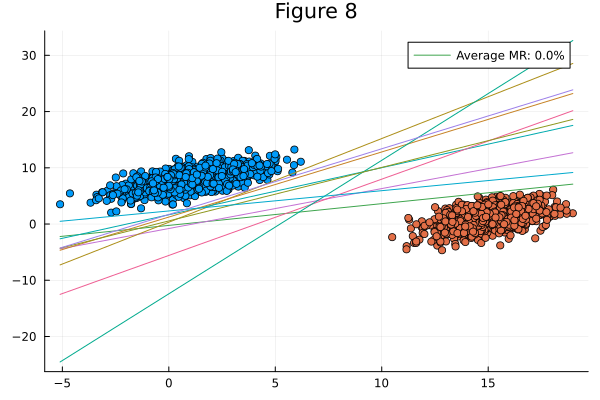

In [34]:
dec_boundaries, avg_misclassification = sensitivity_analysis(X_3,y_3)
plot_sensitivity_analysis(X_3, y_3, dec_boundaries, avg_misclassification, figure_title="Figure 8")

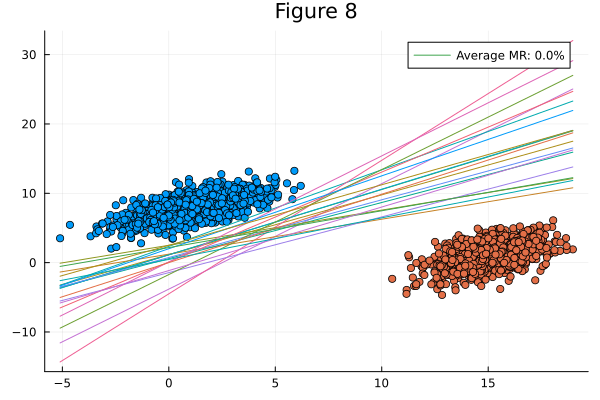

In [35]:
dec_boundaries, avg_misclassification = sensitivity_analysis(X_3,y_3, 20)
plot_sensitivity_analysis(X_3, y_3, dec_boundaries, avg_misclassification, figure_title="Figure 8")

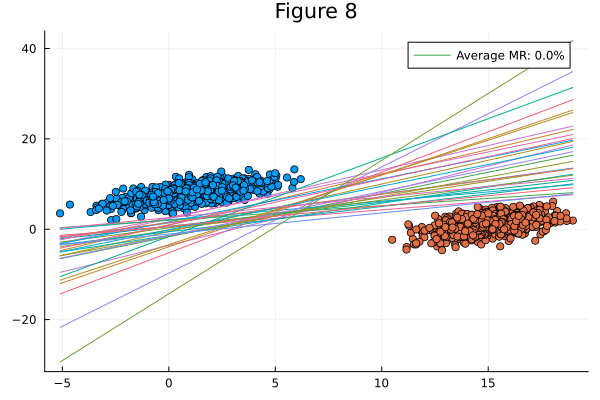

In [36]:
dec_boundaries, avg_misclassification = sensitivity_analysis(X_3,y_3, 30)
plot_sensitivity_analysis(X_3, y_3, dec_boundaries, avg_misclassification, figure_title="Figure 8")

Similar to perceptron_model_2, the perceptron_model_3 also has no problem on classifying the data as it shows a misclassification rate of 0% as shown in figure 7. 

Also with the data being noticeably easy to classify since they are grouped apart really well that even with 10, 20, or even 30 trainings the perceptron performs perfectly. This is similar with problem 2 that when data are grouped really well it will be easy to classify as oppose to problem 1 where there will most likely be misclassifications because of the bottleneck the data offers.